# IT Academy - Data Science with Python
## Sprint 6: Data, Probabilities & Statistics
### [Github Data, Probabilities & Statistics](https://github.com/jesussantana/Statistics)

[![forthebadge made-with-python](http://ForTheBadge.com/images/badges/made-with-python.svg)](https://www.python.org/)  
[![Made withJupyter](https://img.shields.io/badge/Made%20with-Jupyter-orange?style=for-the-badge&logo=Jupyter)](https://jupyter.org/try)  
[![wakatime](https://wakatime.com/badge/github/jesussantana/Statistics.svg)](https://wakatime.com/badge/github/jesussantana/Statistics)

### Exercise 1:  

  - Grab a sports theme dataset you like and select an attribute from the dataset. Calculate the mode, median, standard deviation, and arithmetic mean.

In [1]:
# Data treatment
# ==============================================================================
import numpy as np
import pandas as pd
import datetime
import time
from tabulate import tabulate

# # Graphics
# ==============================================================================
import matplotlib.pyplot as plt
from matplotlib import style
import matplotlib.ticker as ticker
import seaborn as sns
from plotly.subplots import make_subplots
import plotly.graph_objects as go


# Preprocessing and modeling
# ==============================================================================
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.formula.api import ols

from scipy import stats
from scipy.stats import ttest_1samp,ttest_ind
from scipy.stats import normaltest
from scipy.stats import f_oneway
from scipy.stats.mstats import gmean,hmean

from imblearn.over_sampling import SMOTE

from sklearn import metrics
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RepeatedKFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.datasets import make_blobs
from sklearn.metrics import euclidean_distances
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import Ridge

from skopt.space import Real, Integer
from skopt.utils import use_named_args
from skopt import gp_minimize
from skopt.plots import plot_convergence

# Various
# ==============================================================================
import multiprocessing
import random as rd
from itertools import product
from fitter import Fitter, get_common_distributions

# Pandas configuration
# ==============================================================================
pd.set_option('display.max_columns', None)

# Matplotlib configuration
# ==============================================================================
plt.rcParams['image.cmap'] = "bwr"
#plt.rcParams['figure.dpi'] = "100"
plt.rcParams['savefig.bbox'] = "tight"
style.use('ggplot') or plt.style.use('ggplot')
%matplotlib inline

# Seaborn configuration
# ==============================================================================
sns.set_theme(style='darkgrid', palette='deep')

# Warnings configuration
# ==============================================================================
import warnings
warnings.filterwarnings('ignore')

# Scripts folder configuration
# ==============================================================================
import sys
new_path = '../scripts/'
if new_path not in sys.path:
    sys.path.append(new_path)
    sys.path.append(new_path)

In [2]:
# Path folder configuration
# ===============================================================================

path = '../data/'
file = 'raw/MLB_Stats.csv'

df_raw = pd.read_csv(path+file)

In [3]:
## Simple Sample
#df = df_raw.sample(frac=0.1, replace=True, random_state=6858)

In [4]:
df = df_raw.copy()

In [5]:
df.head()

,playerID,Player Name,weight,height,bats,throws,Season,League,teamID,Team,Franchise,G,AB,R,H,2B,3B,HR,RBI,SB,BB,SO,salary,IBB,HBP,SH,SF,PA
0,aardsda01,David Aardsma,215,75,R,R,2004,NL,SFN,San Francisco Giants,San Francisco Giants,11,0,0,0,0,0,0,0,0,0,0,300000,0,0,0,0,0
1,aardsda01,David Aardsma,215,75,R,R,2007,AL,CHA,Chicago White Sox,Chicago White Sox,25,0,0,0,0,0,0,0,0,0,0,387500,0,0,0,0,0
2,aardsda01,David Aardsma,215,75,R,R,2008,AL,BOS,Boston Red Sox,Boston Red Sox,47,1,0,0,0,0,0,0,0,0,1,403250,0,0,0,0,1
3,aardsda01,David Aardsma,215,75,R,R,2009,AL,SEA,Seattle Mariners,Seattle Mariners,73,0,0,0,0,0,0,0,0,0,0,419000,0,0,0,0,0
4,aardsda01,David Aardsma,215,75,R,R,2012,AL,NYA,New York Yankees,New York Yankees,1,0,0,0,0,0,0,0,0,0,0,500000,0,0,0,0,0


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28293 entries, 0 to 28292
Data columns (total 28 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   playerID     28293 non-null  object
 1   Player Name  28293 non-null  object
 2   weight       28293 non-null  int64 
 3   height       28293 non-null  int64 
 4   bats         28293 non-null  object
 5   throws       28293 non-null  object
 6   Season       28293 non-null  int64 
 7   League       28293 non-null  object
 8   teamID       28293 non-null  object
 9   Team         28293 non-null  object
 10  Franchise    28293 non-null  object
 11  G            28293 non-null  int64 
 12  AB           28293 non-null  int64 
 13  R            28293 non-null  int64 
 14  H            28293 non-null  int64 
 15  2B           28293 non-null  int64 
 16  3B           28293 non-null  int64 
 17  HR           28293 non-null  int64 
 18  RBI          28293 non-null  int64 
 19  SB           28293 non-nu

In [7]:
df.shape

(28293, 28)

In [8]:
df.columns

Index(['playerID', 'Player Name', 'weight', 'height', 'bats', 'throws',
       'Season', 'League', 'teamID', 'Team', 'Franchise', 'G', 'AB', 'R', 'H',
       '2B', '3B', 'HR', 'RBI', 'SB', 'BB', 'SO', 'salary', 'IBB', 'HBP', 'SH',
       'SF', 'PA'],
      dtype='object')

In [9]:
df.isna().sum().sort_values()

playerID       0
SH             0
HBP            0
IBB            0
salary         0
SO             0
BB             0
SB             0
RBI            0
HR             0
3B             0
2B             0
H              0
R              0
AB             0
G              0
Franchise      0
Team           0
teamID         0
League         0
Season         0
throws         0
bats           0
height         0
weight         0
Player Name    0
SF             0
PA             0
dtype: int64

In [10]:
df.describe().round(2)

,weight,height,Season,G,AB,R,H,2B,3B,HR,RBI,SB,BB,SO,salary,IBB,HBP,SH,SF,PA
count,28293.00,28293.00,28293.00,28293.00,28293.00,28293.00,28293.00,28293.00,28293.00,28293.00,28293.00,28293.00,28293.00,28293.00,28293.00,28293.00,28293.00,28293.00,28293.00,28293.00
mean,199.05,73.50,2000.94,63.93,161.88,21.79,42.62,8.22,0.91,4.78,20.78,3.11,15.80,30.38,2112965.47,1.33,1.45,1.53,1.37,183.36
std,22.65,2.29,8.90,47.29,199.41,30.13,56.20,11.40,1.83,8.38,29.70,7.49,23.04,37.62,3440239.06,3.16,2.78,2.75,2.21,226.22
min,140.00,66.00,1985.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,10900.00,0.00,0.00,0.00,0.00,0.00
25%,185.00,72.00,1994.00,26.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,300000.00,0.00,0.00,0.00,0.00,1.00
50%,195.00,74.00,2001.00,50.00,57.00,4.00,10.00,2.00,0.00,0.00,4.00,0.00,3.00,15.00,600000.00,0.00,0.00,0.00,0.00,66.00
75%,215.00,75.00,2009.00,101.00,298.00,37.00,76.00,14.00,1.00,6.00,34.00,2.00,25.00,50.00,2425000.00,1.00,2.00,2.00,2.00,337.00
max,315.00,83.00,2016.00,163.00,716.00,152.00,262.00,59.00,23.00,73.00,165.00,110.00,232.00,223.00,33000000.00,120.00,35.00,39.00,17.00,783.00


In [11]:
df.describe(include=['object'])

,playerID,Player Name,bats,throws,League,teamID,Team,Franchise
count,28293,28293,28293,28293,28293,28293,28293,28293
unique,5005,4931,3,2,2,35,35,30
top,moyerja01,Alex Gonzalez,R,R,NL,BOS,Boston Red Sox,Boston Red Sox
freq,27,33,17456,22188,14459,1057,1057,1057


In [12]:
df.Team.unique()

array(['San Francisco Giants', 'Chicago White Sox', 'Boston Red Sox',
       'Seattle Mariners', 'New York Yankees', 'New York Mets',
       'Baltimore Orioles', 'Cincinnati Reds', 'Houston Astros',
       'Oakland Athletics', 'Minnesota Twins', 'Florida Marlins',
       'California Angels', 'Milwaukee Brewers', 'Atlanta Braves',
       'Colorado Rockies', 'Philadelphia Phillies',
       'Tampa Bay Devil Rays', 'Kansas City Royals', 'San Diego Padres',
       'Los Angeles Angels of Anaheim', 'Los Angeles Dodgers',
       'Arizona Diamondbacks', 'Toronto Blue Jays', 'St. Louis Cardinals',
       'Detroit Tigers', 'Cleveland Indians', 'Texas Rangers',
       'Chicago Cubs', 'Montreal Expos', 'Anaheim Angels',
       'Tampa Bay Rays', 'Pittsburgh Pirates', 'Miami Marlins',
       'Washington Nationals'], dtype=object)

## Distribution of the response variable

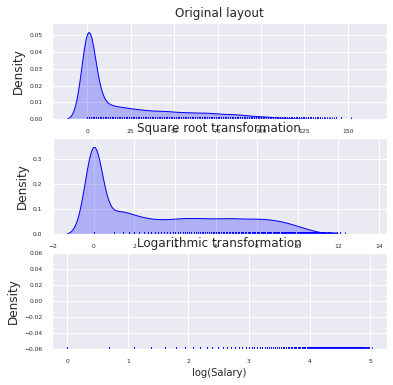

In [13]:
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(6, 6))
sns.distplot(
    df.R,
    hist    = False,
    rug     = True,
    color   = "blue",
    kde_kws = {'shade': True, 'linewidth': 1},
    ax      = axes[0]
)
axes[0].set_title("Original layout", fontsize = 'medium')
axes[0].set_xlabel('Salary', fontsize='small') 
axes[0].tick_params(labelsize = 6)

sns.distplot(
    np.sqrt(df.R),
    hist    = False,
    rug     = True,
    color   = "blue",
    kde_kws = {'shade': True, 'linewidth': 1},
    ax      = axes[1]
)
axes[1].set_title("Square root transformation", fontsize = 'medium')
axes[1].set_xlabel('sqrt(Salary)', fontsize='small') 
axes[1].tick_params(labelsize = 6)

sns.distplot(
    np.log(df.R),
    hist    = False,
    rug     = True,
    color   = "blue",
    kde_kws = {'shade': True, 'linewidth': 1},
    ax      = axes[2]
)
axes[2].set_title("Logarithmic transformation", fontsize = 'medium')
axes[2].set_xlabel('log(Salary)', fontsize='small') 
axes[2].tick_params(labelsize = 6)

## Runs Scored

In [14]:
df.Team.value_counts()

Boston Red Sox                   1057
Los Angeles Dodgers              1050
New York Yankees                 1033
Philadelphia Phillies            1026
Cleveland Indians                1024
San Diego Padres                 1004
Oakland Athletics                1002
Pittsburgh Pirates                999
Baltimore Orioles                 999
New York Mets                     995
St. Louis Cardinals               994
Kansas City Royals                993
Cincinnati Reds                   991
Chicago Cubs                      987
San Francisco Giants              985
Toronto Blue Jays                 979
Atlanta Braves                    970
Milwaukee Brewers                 963
Detroit Tigers                    955
Texas Rangers                     955
Chicago White Sox                 951
Seattle Mariners                  938
Houston Astros                    925
Minnesota Twins                   888
Colorado Rockies                  759
Florida Marlins                   627
Montreal Exp

### Mean  or Arithmetic Median 

In [15]:
df_mean = round(df.R.mean(), 2)
df_mean

21.79

### Median

In [16]:
df_median = round(df.R.median())
df_median

4

### Mode

In [17]:
df_mode = stats.mode(df.R)
df_mode

ModeResult(mode=array([0]), count=array([10555]))

### Standard Desviation

In [18]:
df_std = round(df.R.std(), 2)
df_std

30.13

### Resume

In [19]:
df.R.describe().round(2)

count    28293.00
mean        21.79
std         30.13
min          0.00
25%          0.00
50%          4.00
75%         37.00
max        152.00
Name: R, dtype: float64

### Exercise 2: 
  - Continuing with the sports topic data, select two attributes and calculate their correlation.

## Hits v Runs Scored

In [20]:
correlation =df[['H','R']].corr()
correlation

,H,R
H,1.000000,0.973927
R,0.973927,1.000000


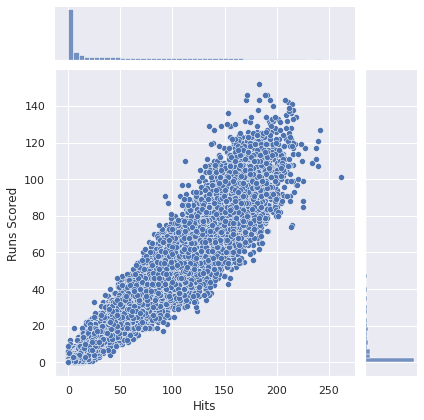

In [21]:
ax = sns.jointplot(df.H, df.R)
ax.set_axis_labels('Hits', 'Runs Scored')
plt.show()

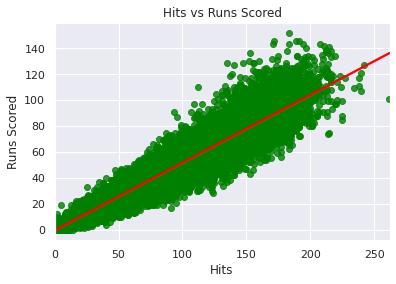

In [22]:
ax = sns.regplot('H', 'R', df, scatter_kws={"color": "green"}, line_kws={"color": "red"})
ax.set(title='Hits vs Runs Scored',
        xlabel='Hits',
        ylabel='Runs Scored')
plt.show()

## Exercise 3
- Continuing with the sports theme data, calculate the correlation of all attributes with each other and represent them in a matrix with different colors of intensity.

### Pearson Correlation

- The Pearson Correlation measures the linear dependence between two variables X and Y.

- The resulting coefficient is a value between -1 and 1 inclusive, where:

  - 1: Total positive linear correlation.  

  - 0: No linear correlation, the two variables most likely do not affect each other.  

  - -1: Total negative linear correlation.  

Pearson Correlation is the default method of the function "corr". Like before we can calculate the Pearson Correlation of the of the 'int64' or 'float64' variables.

In [23]:
corr = df.corr()
corr.style.background_gradient(cmap="magma")

,weight,height,Season,G,AB,R,H,2B,3B,HR,RBI,SB,BB,SO,salary,IBB,HBP,SH,SF,PA
weight,1.000000,0.539801,0.424305,-0.080874,-0.089453,-0.082409,-0.088201,-0.047991,-0.167602,0.079272,-0.004831,-0.188545,-0.053066,0.019234,0.199390,0.015383,-0.000076,-0.171095,-0.053696,-0.086644
height,0.539801,1.000000,0.053006,-0.226921,-0.247089,-0.224280,-0.238658,-0.207761,-0.239918,-0.053734,-0.146632,-0.244606,-0.183132,-0.148450,0.074569,-0.059576,-0.169205,-0.171330,-0.168878,-0.243096
Season,0.424305,0.053006,1.000000,-0.000024,-0.006963,-0.009216,-0.009511,0.020309,-0.037861,0.026258,-0.005310,-0.054530,-0.024156,0.068342,0.360058,-0.053137,0.078766,-0.069433,-0.029906,-0.009507
G,-0.080874,-0.226921,-0.000024,1.000000,0.925185,0.890184,0.913764,0.877293,0.616526,0.741302,0.863851,0.540927,0.829148,0.838210,0.161444,0.565503,0.615681,0.219020,0.749810,0.925421
AB,-0.089453,-0.247089,-0.006963,0.925185,1.000000,0.964169,0.990083,0.949833,0.667282,0.801458,0.932611,0.594885,0.879662,0.902060,0.208777,0.594423,0.662064,0.254001,0.807163,0.998472
R,-0.082409,-0.224280,-0.009216,0.890184,0.964169,1.000000,0.973927,0.940240,0.676805,0.850300,0.940211,0.635824,0.913207,0.876136,0.227782,0.620724,0.670292,0.198617,0.788262,0.969915
H,-0.088201,-0.238658,-0.009511,0.913764,0.990083,0.973927,1.000000,0.959691,0.673932,0.807341,0.940241,0.603232,0.877870,0.869399,0.215163,0.613838,0.657334,0.222208,0.807441,0.989378
2B,-0.047991,-0.207761,0.020309,0.877293,0.949833,0.940240,0.959691,1.000000,0.608920,0.802907,0.926061,0.527097,0.854106,0.851604,0.218769,0.603397,0.651481,0.169373,0.794655,0.950494
3B,-0.167602,-0.239918,-0.037861,0.616526,0.667282,0.676805,0.673932,0.608920,1.000000,0.418096,0.553260,0.656541,0.550569,0.567397,0.043979,0.327102,0.403740,0.261907,0.486607,0.661730
HR,0.079272,-0.053734,0.026258,0.741302,0.801458,0.850300,0.807341,0.802907,0.418096,1.000000,0.928067,0.345063,0.814773,0.830452,0.275698,0.656352,0.598416,-0.029055,0.705839,0.812508


### Exercise 4: 
  - Continuing with the sports theme data, select an attribute and calculate the geometric mean and harmonic mean.

## Games

### Geometric Mean

In [24]:
geometric_mean = round(gmean(df.loc[:,'G']), 2)
print("Geometric Mean is % s " % (geometric_mean))

Geometric Mean is 43.93 


### Harmonic Mean

In [25]:
harmonic_mean = round(hmean(df.loc[:,'G']), 2)
print("Harmonic Mean is % s " % (harmonic_mean))

Harmonic Mean is 22.37 
